In [36]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
import seaborn as sns


In [37]:
# data_path = 'data/processed/combined_labeled.csv'
# df = pd.read_csv(data_path)

data_path = 'data/processed/combined_labeled_standardized.csv'
df = pd.read_csv(data_path)

In [38]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Columns: 34470 entries, patient_id to ENSG00000288638.1
dtypes: float64(34468), int64(1), object(1)
memory usage: 131.5+ MB


In [39]:
df.head()

,patient_id,healthy,ENSG00000000003.15,ENSG00000000005.6,ENSG00000000457.14,ENSG00000000460.17,ENSG00000000938.13,ENSG00000000971.16,ENSG00000001036.14,ENSG00000001084.13,...,ENSG00000288460.1,ENSG00000288547.3,ENSG00000288558.2,ENSG00000288569.1,ENSG00000288582.2,ENSG00000288596.2,ENSG00000288601.1,ENSG00000288603.1,ENSG00000288611.1,ENSG00000288638.1
0,GTEX-111FC-3326-SM-5GZYV,1,0.135330,-0.644255,-0.165947,0.573518,0.286618,0.665016,0.910183,0.018292,...,-0.167564,0.420969,-0.318247,1.347539,-0.086992,0.220568,0.0,-0.288632,-0.871707,-0.36232
1,GTEX-1128S-2826-SM-5N9DI,1,-0.845590,-0.644255,-1.272226,-0.115995,0.045738,-0.175576,-0.661327,-0.613966,...,-0.167564,-0.479962,-0.044186,1.395051,-0.086992,-1.072841,0.0,-0.288632,-0.871707,-0.36232
2,GTEX-117XS-3126-SM-5GIDP,1,-0.015751,-0.644255,0.284490,-0.215636,-0.549595,-0.106686,0.786310,0.453277,...,1.686318,-0.479962,1.189672,0.556001,-0.086992,0.438793,0.0,-0.288632,0.396771,-0.36232
3,GTEX-1192X-3226-SM-5987D,1,0.050174,-0.644255,0.479352,1.753002,1.728641,0.078842,-0.830247,0.536120,...,-0.167564,-0.479962,1.187342,-0.675032,-0.086992,-0.808302,0.0,-0.288632,-0.425684,-0.36232
4,GTEX-11DXW-1026-SM-5H11K,1,-0.071209,4.799695,-0.131297,0.338815,-0.756995,-0.471912,0.822626,-0.177194,...,-0.167564,-0.479962,-0.069146,-0.675032,-0.086992,0.404978,0.0,9.602309,1.879187,-0.36232


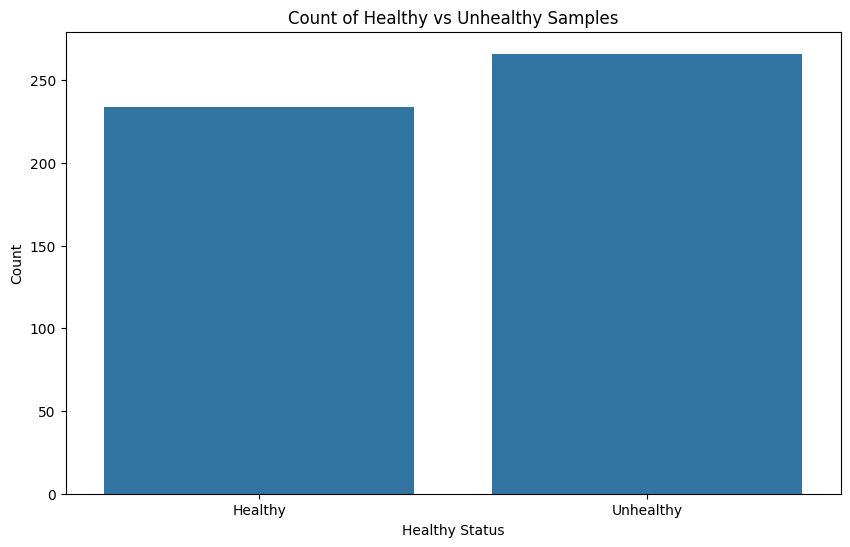

In [40]:
# bar chart to show healthy/unhealthy samples
plt.figure(figsize=(10, 6))
sns.countplot(x='healthy', data=df)
plt.title('Count of Healthy vs Unhealthy Samples')

plt.xlabel('Healthy Status')
plt.ylabel('Count')
plt.xticks([0, 1], ['Healthy', 'Unhealthy'])
plt.show()

In [ ]:
# df needs to be transposed for faster processing of correlation_matrix matrix (initial run took 15min before the kernel crashed) and PCA
df_transposed = df.transpose()
# df_transposed.info()
df_transposed.head()

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
patient_id,GTEX-111FC-3326-SM-5GZYV,GTEX-1128S-2826-SM-5N9DI,GTEX-117XS-3126-SM-5GIDP,GTEX-1192X-3226-SM-5987D,GTEX-11DXW-1026-SM-5H11K,GTEX-11DXY-3126-SM-5N9BT,GTEX-11DYG-2926-SM-5H132,GTEX-11DZ1-2926-SM-5A5KI,GTEX-11EI6-2926-SM-5985U,GTEX-11EMC-3326-SM-5P9JH,...,TCGA-GBM.e7dcdd6d-aa28-48e9-949c-af8da8cdf5c0....,TCGA-GBM.f26408e6-2880-47d7-9dae-6d2d481c1ea0....,TCGA-GBM.f26408e6-2880-47d7-9dae-6d2d481c1ea0....,TCGA-GBM.f26408e6-2880-47d7-9dae-6d2d481c1ea0....,TCGA-GBM.f2ed0046-56d9-4a89-91d8-de86bf55d007....,TCGA-GBM.f2ed0046-56d9-4a89-91d8-de86bf55d007....,TCGA-GBM.f2ed0046-56d9-4a89-91d8-de86bf55d007....,TCGA-GBM.fe4f878a-6e1b-4d1b-b2a1-957e9da501ac....,TCGA-GBM.fe4f878a-6e1b-4d1b-b2a1-957e9da501ac....,TCGA-GBM.fe4f878a-6e1b-4d1b-b2a1-957e9da501ac....
healthy,1,1,1,1,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
ENSG00000000003.15,0.13533,-0.84559,-0.015751,0.050174,-0.071209,0.073979,-0.123632,0.14121,-0.718283,0.063722,...,-0.630694,NaN,-0.630694,-0.630694,NaN,0.148983,0.148983,NaN,-0.630694,-0.630694
ENSG00000000005.6,-0.644255,-0.644255,-0.644255,-0.644255,4.799695,-0.644255,-0.644255,-0.644255,0.95069,-0.644255,...,-0.630694,NaN,-0.630694,-0.630694,NaN,0.148983,0.148983,NaN,-0.630694,-0.630694
ENSG00000000457.14,-0.165947,-1.272226,0.28449,0.479352,-0.131297,0.245012,0.683451,-1.341089,-1.482048,-1.038885,...,-0.643557,0.432103,0.432103,0.432103,-0.643557,-0.643557,-0.643557,-0.643557,-0.643557,1.507763


In [43]:
# Exclude non-numeric rows and columns
numeric_df = df_transposed.iloc[2:].apply(pd.to_numeric, errors='coerce')

# Compute the correlation matrix
correlation_matrix = numeric_df.corr()
correlation_matrix

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
0,1.000000,-0.034494,0.033582,0.005527,-0.001723,0.066739,0.044328,-0.012295,0.026889,0.020985,...,-0.002912,0.015522,0.007456,0.007178,-0.018592,-0.012934,-0.001742,-0.001381,-0.001131,0.006082
1,-0.034494,1.000000,-0.074214,0.008055,-0.030591,-0.063137,-0.069062,0.141207,0.196399,0.080574,...,0.006763,-0.017803,-0.015989,-0.014208,0.005010,0.004063,0.004205,-0.007698,-0.008091,-0.009856
2,0.033582,-0.074214,1.000000,0.024672,-0.009874,0.047242,0.039414,-0.026182,-0.147661,-0.061272,...,0.003318,0.012212,0.008912,0.007440,0.008168,0.007531,0.007041,0.003660,-0.001474,-0.000114
3,0.005527,0.008055,0.024672,1.000000,-0.040523,-0.028551,-0.052721,0.197963,-0.022114,-0.021711,...,-0.002313,0.002791,0.001580,0.000977,-0.021053,-0.016727,-0.015054,0.001227,0.014047,0.003142
4,-0.001723,-0.030591,-0.009874,-0.040523,1.000000,0.066046,0.054750,-0.071743,-0.022855,0.018956,...,0.003351,0.009233,0.000455,0.001887,-0.017072,-0.019766,-0.019699,0.005112,0.008650,0.003667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,-0.012934,0.004063,0.007531,-0.016727,-0.019766,-0.026985,-0.002282,-0.012354,0.018339,0.004759,...,0.071280,0.064378,0.070013,0.066503,0.678316,1.000000,0.855580,0.096803,0.017058,-0.306437
496,-0.001742,0.004205,0.007041,-0.015054,-0.019699,-0.020350,-0.000760,-0.007738,0.014781,0.001271,...,0.061312,0.052701,0.057970,0.040723,0.503309,0.855580,1.000000,0.088656,0.009270,-0.282436
497,-0.001381,-0.007698,0.003660,0.001227,0.005112,0.010287,0.004542,-0.007837,-0.029331,0.001053,...,-0.116606,0.100486,0.103308,0.102032,0.222359,0.096803,0.088656,1.000000,0.555829,0.523709
498,-0.001131,-0.008091,-0.001474,0.014047,0.008650,0.011035,0.002187,0.006219,-0.026486,-0.002836,...,-0.067216,0.055172,0.055658,0.054002,0.118642,0.017058,0.009270,0.555829,1.000000,0.685496


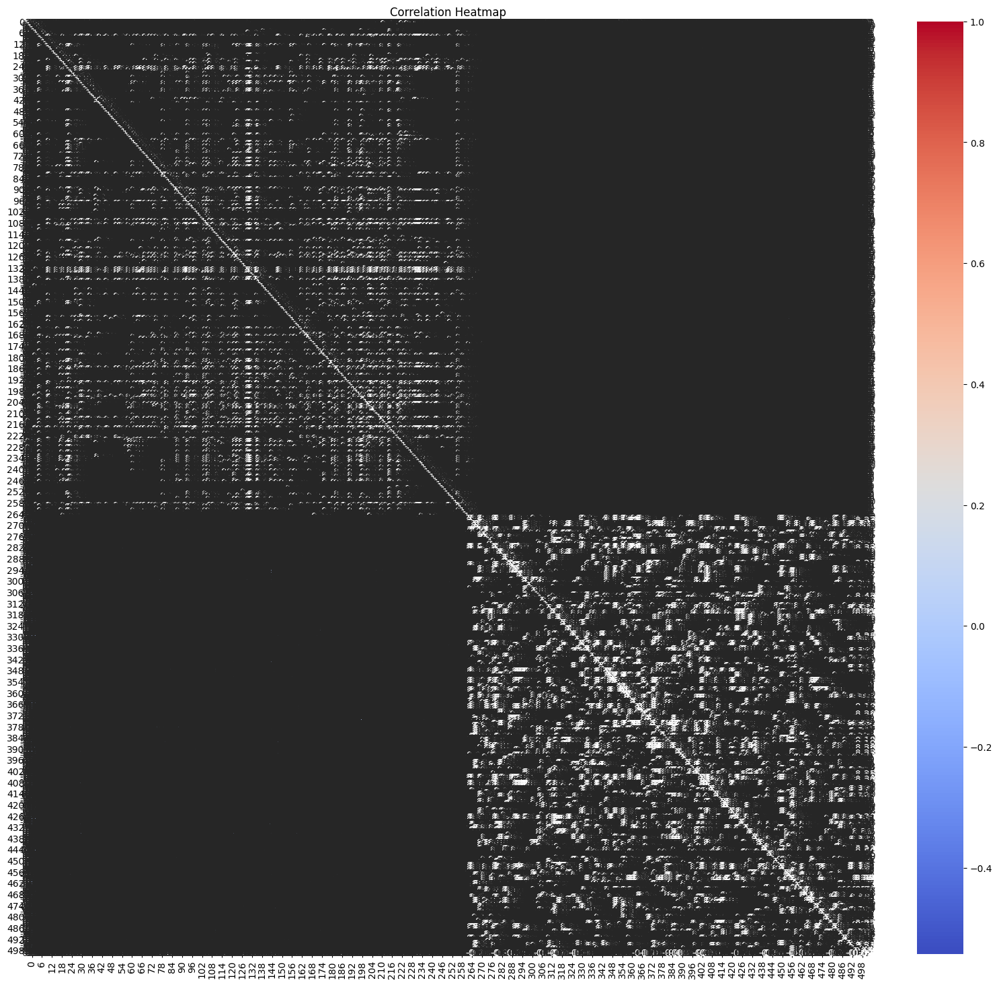

In [ ]:
# Correlation heatmap
# todo: heatmap is not showing the correlation matrix correctly, need to investigate

plt.figure(figsize=(20, 18))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()

In [45]:
X = df.drop('healthy', axis=1)
y = df['healthy']

In [46]:
# Drop non-numeric columns from X
X = X.select_dtypes(include=[np.number])
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [47]:
from sklearn.impute import SimpleImputer
# todo: should this be in preprocessing?

# Handle missing values by imputing with the mean
imputer = SimpleImputer(strategy='mean')
X_scaled_imputed = imputer.fit_transform(X_scaled)

# Perform PCA
pca = PCA().fit(X_scaled_imputed)
explained = np.cumsum(pca.explained_variance_ratio_)
n_components = np.argmax(explained >= 0.95) + 1
print(f"Number of components for >=95% variance: {n_components}")

Number of components for >=95% variance: 249


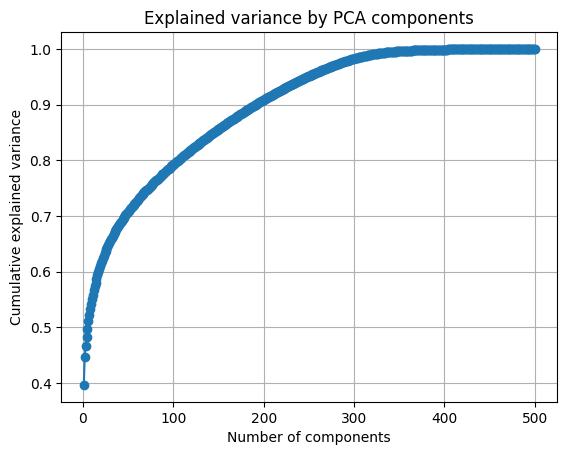

In [48]:
# Visualize explained variance
plt.figure()
plt.plot(np.arange(1, len(explained)+1), explained, marker='o')
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')
plt.title('Explained variance by PCA components')
plt.grid()
plt.show()

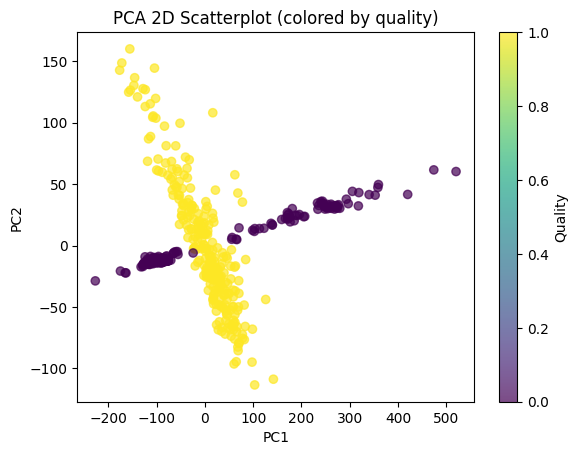

In [49]:
# 2D scatterplot
X_scaled_imputed = imputer.transform(X_scaled)  # Impute missing values
pca2 = PCA(n_components=2)
X_pca2 = pca2.fit_transform(X_scaled_imputed)
plt.figure()
scatter = plt.scatter(X_pca2[:,0], X_pca2[:,1], c=y, cmap='viridis', alpha=0.7)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('PCA 2D Scatterplot (colored by quality)')
plt.colorbar(scatter, label='Quality')
plt.show()